# Reinforcement Learning Offline

### Phase 0: Import libraries and read data

In [1]:
# import libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import plotly.express as px
import d3rlpy
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import seaborn as sns
sns.set_theme()

In [2]:
variables_interes=['pyrite law', 'chalcopyrite law',
       'chalcocite law', 'covelin law', 'crusher index', 'sag power index',
       'ball work index', 'bornite law','charge cell', 'TPH','water', 'speed','HH TPH', 'granulometry','loss of TPH',
       "power","solid percentage","HH charge cell","LL charge cell","delta HH TPH","delta HH charge cell","delta LL charge cell","Edad"]

In [3]:
states=[
 'charge cell',
 'water',
 'speed',
 'HH TPH',
 'granulometry',
 'solid percentage',
 'HH charge cell',
 #"Edad"
 ]

actions=[
    'HH charge cell'
    ]

reward=[
    "loss of TPH"
    ]

In [4]:
# read dictionary
tags=pd.read_excel("..\\data\\tags relevantes.xlsx")
tags_cc=tags.tag.to_list()
dic={}
for i,j in zip(tags.tag,tags.description):
    dic[i]=j

In [5]:
# read data
liners_age=pd.read_csv('../data/liners_age_17December2022.csv', parse_dates=['Timestamp'], index_col='Timestamp')
df=pd.read_csv("..\data\cleaned_15December2022.csv", parse_dates=['Timestamp'], index_col='Timestamp')
df.rename(columns=dic,inplace=True)
df=df.join(liners_age)#.dropna()
df["delta HH TPH"]=df["HH TPH"]-df["TPH"]
df["delta HH charge cell"]=df["HH charge cell"]-df["charge cell"]
df["delta LL charge cell"]=df["charge cell"]-df["LL charge cell"]
df["loss of TPH"]=df["delta HH TPH"].apply(lambda x: -1 if x>100 else 1)
df=df[variables_interes]

# Done MDP: se considera como tarea finalizada cuando el turno termina a las 12:00 o 00:00
df["terminals"]=df.reset_index().apply(lambda x: 1 if (x["Timestamp"].strftime("%H:%M")=="12:00") or (x["Timestamp"].strftime("%H:%M")=="00:00") else 0,axis=1).values

df.head(1)

,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,charge cell,TPH,...,loss of TPH,power,solid percentage,HH charge cell,LL charge cell,delta HH TPH,delta HH charge cell,delta LL charge cell,Edad,terminals
Timestamp,,,,,,,,,,,,,,,,,,,,,
2018-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,864.295848,3847.009774,...,-1,23071.203516,65.090716,900.0,820.0,502.990226,35.704152,44.295848,1.0,1


### Phase 1: Split data train/test & processing

In [6]:
# Entrenamiento
entrenamiento=pd.concat([df["2020-01":"2020-03"],df["2020-05":"2020-12"],df["2021-01":"2021-08"],df["2021-10":"2021-12"]])
entrenamiento=entrenamiento[entrenamiento["HH charge cell"]<950]
Ytrain=entrenamiento[["loss of TPH","terminals"]]
Xtrain=entrenamiento.drop(columns=["loss of TPH","terminals"])
print(Ytrain["loss of TPH"].value_counts())
print(Ytrain["terminals"].value_counts())
Xtrain.head()

 1    726370
-1    219894
Name: loss of TPH, dtype: int64
0    944946
1      1318
Name: terminals, dtype: int64


,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,charge cell,TPH,...,HH TPH,granulometry,power,solid percentage,HH charge cell,LL charge cell,delta HH TPH,delta HH charge cell,delta LL charge cell,Edad
Timestamp,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,3.0,0.97,0.57,0.01,19.0047,86.2584,14.934,0.0,803.490132,3828.784455,...,3850.0,NaN,18875.344010,76.920305,850.0,770.0,21.215545,46.509868,33.490132,1.0
2020-01-01 00:01:00,3.0,0.97,0.57,0.01,19.0047,86.2584,14.934,0.0,800.655630,3847.047161,...,3850.0,NaN,18877.181738,77.089221,850.0,770.0,2.952839,49.344370,30.655630,1.0
2020-01-01 00:02:00,3.0,0.97,0.57,0.01,19.0047,86.2584,14.934,0.0,799.830821,3823.580374,...,3850.0,NaN,18910.054672,76.959369,850.0,770.0,26.419626,50.169179,29.830821,1.0
2020-01-01 00:03:00,3.0,0.97,0.57,0.01,19.0047,86.2584,14.934,0.0,798.629332,3850.106659,...,3850.0,NaN,18908.321962,77.078884,850.0,770.0,-0.106659,51.370668,28.629332,1.0
2020-01-01 00:04:00,3.0,0.97,0.57,0.01,19.0047,86.2584,14.934,0.0,797.869900,3822.993158,...,3850.0,NaN,18959.604226,76.966907,850.0,770.0,27.006842,52.130100,27.869900,1.0


In [7]:
# Test
test=pd.concat([df["2020-04"],df["2021-09"]])
Ytest=test[["loss of TPH","terminals"]]
Xtest=test.drop(columns=["loss of TPH","terminals"])
print(Ytest["loss of TPH"].value_counts())
print(Ytest["terminals"].value_counts())
Xtest.head()

 1    61577
-1    24823
Name: loss of TPH, dtype: int64
0    86280
1      120
Name: terminals, dtype: int64


,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,charge cell,TPH,...,HH TPH,granulometry,power,solid percentage,HH charge cell,LL charge cell,delta HH TPH,delta HH charge cell,delta LL charge cell,Edad
Timestamp,,,,,,,,,,,,,,,,,,,,,
2020-04-01 00:00:00,2.84,1.53,0.54,0.03,20.9675,116.3165,17.0169,0.02,755.748750,4139.451400,...,3800.0,30.530144,23865.269824,65.032940,840.0,760.0,-339.451400,84.251250,-4.251250,2.0
2020-04-01 00:01:00,2.84,1.53,0.54,0.03,20.9675,116.3165,17.0169,0.02,753.892990,4167.058761,...,3800.0,30.514721,23843.675060,65.079082,840.0,760.0,-367.058761,86.107010,-6.107010,2.0
2020-04-01 00:02:00,2.84,1.53,0.54,0.03,20.9675,116.3165,17.0169,0.02,752.232083,4172.829661,...,3800.0,30.583668,23779.315798,65.027029,840.0,760.0,-372.829661,87.767917,-7.767917,2.0
2020-04-01 00:03:00,2.84,1.53,0.54,0.03,20.9675,116.3165,17.0169,0.02,749.863432,4176.842600,...,3800.0,30.753843,23740.527706,65.059235,840.0,760.0,-376.842600,90.136568,-10.136568,2.0
2020-04-01 00:04:00,2.84,1.53,0.54,0.03,20.9675,116.3165,17.0169,0.02,748.145028,4157.952353,...,3800.0,30.850665,23710.699931,64.927029,840.0,760.0,-357.952353,91.854972,-11.854972,2.0


In [8]:
# scaler
scaler = MinMaxScaler()

In [9]:
Xtrain_0=pd.DataFrame(scaler.fit_transform(Xtrain[states]),columns=states,index=Xtrain.index)
Xtrain_0.head()

,charge cell,water,speed,HH TPH,granulometry,solid percentage,HH charge cell
Timestamp,,,,,,,
2020-01-01 00:00:00,0.564289,0.460141,0.837683,0.455111,NaN,0.749003,0.657336
2020-01-01 00:01:00,0.557999,0.457904,0.837741,0.455111,NaN,0.757484,0.657336
2020-01-01 00:02:00,0.556169,0.458607,0.837629,0.455111,NaN,0.750964,0.657336
2020-01-01 00:03:00,0.553502,0.458650,0.837647,0.455111,NaN,0.756965,0.657336
2020-01-01 00:04:00,0.551817,0.458409,0.837663,0.455111,NaN,0.751343,0.657336


In [10]:
Xtest_0=pd.DataFrame(scaler.transform(Xtest[states]),columns=states,index=Xtest.index)
Xtest_0.head()

,charge cell,water,speed,HH TPH,granulometry,solid percentage,HH charge cell
Timestamp,,,,,,,
2020-04-01 00:00:00,0.458344,0.892530,0.955534,0.423059,0.113582,0.152131,0.622739
2020-04-01 00:01:00,0.454225,0.896485,0.955546,0.423059,0.113374,0.154448,0.622739
2020-04-01 00:02:00,0.450539,0.899146,0.955516,0.423059,0.114302,0.151834,0.622739
2020-04-01 00:03:00,0.445283,0.898756,0.955673,0.423059,0.116592,0.153451,0.622739
2020-04-01 00:04:00,0.441470,0.899656,0.955620,0.423059,0.117894,0.146813,0.622739


In [11]:
df_mdp_train=pd.DataFrame()
# Desfase de x minutos para considerar el estado del molino 5 minutos antes de tomar la decisión
desfase=5
df_mdp_train[states]=Xtrain_0[states].shift(desfase)
df_mdp_train["action"]=Xtrain_0[actions]
df_mdp_train[["loss of TPH","terminals"]]=Ytrain[["loss of TPH","terminals"]]
df_mdp_train.dropna(inplace=True)
print(df_mdp_train.shape)
df_mdp_train.head()

(815699, 10)


,charge cell,water,speed,HH TPH,granulometry,solid percentage,HH charge cell,action,loss of TPH,terminals
Timestamp,,,,,,,,,,
2020-01-09 12:52:00,0.578708,0.575923,0.927811,0.615372,0.409316,0.600766,0.726529,0.726529,1,0
2020-01-09 12:53:00,0.584012,0.578290,0.927836,0.615372,0.375500,0.607491,0.726529,0.726529,1,0
2020-01-09 12:54:00,0.590154,0.579040,0.927920,0.615372,0.342302,0.597125,0.726529,0.726529,1,0
2020-01-09 12:55:00,0.593269,0.576134,0.927766,0.615372,0.309390,0.604400,0.726529,0.726529,1,0
2020-01-09 12:56:00,0.596963,0.576657,0.927853,0.615372,0.280428,0.605681,0.726529,0.726529,1,0


In [12]:
observations_train=df_mdp_train[states].to_numpy()
actions_train=df_mdp_train["action"].to_numpy().reshape(-1,1)
rewards_train=df_mdp_train[reward].to_numpy().squeeze()
terminals_train=df_mdp_train["terminals"].to_numpy()

dataset_train = d3rlpy.dataset.MDPDataset(
    observations=observations_train,
    actions=actions_train,
    rewards=rewards_train,
    terminals=terminals_train,
)

In [13]:
df_mdp_test=pd.DataFrame()
df_mdp_test[states]=Xtest_0[states]
df_mdp_test.dropna(inplace=True)
print(df_mdp_test.shape)
df_mdp_test.head()

(81017, 7)


,charge cell,water,speed,HH TPH,granulometry,solid percentage,HH charge cell
Timestamp,,,,,,,
2020-04-01 00:00:00,0.458344,0.892530,0.955534,0.423059,0.113582,0.152131,0.622739
2020-04-01 00:01:00,0.454225,0.896485,0.955546,0.423059,0.113374,0.154448,0.622739
2020-04-01 00:02:00,0.450539,0.899146,0.955516,0.423059,0.114302,0.151834,0.622739
2020-04-01 00:03:00,0.445283,0.898756,0.955673,0.423059,0.116592,0.153451,0.622739
2020-04-01 00:04:00,0.441470,0.899656,0.955620,0.423059,0.117894,0.146813,0.622739


### Phase 2: Model train

In [14]:
# episode-wise split
train_episodes, test_episodes = train_test_split(dataset_train.episodes)

# setup metrics
metrics = {
  "soft_opc": d3rlpy.metrics.scorer.soft_opc_scorer(return_threshold=180),
  "initial_value": d3rlpy.metrics.scorer.initial_state_value_estimation_scorer,
}

awac = d3rlpy.algos.AWAC()

# start training with episode-wise splits
data_train=awac.fit(
    train_episodes,
    n_epochs=10,
    scorers=metrics,
    eval_episodes=test_episodes,
)

2023-08-23 10:47.43 [debug    ] RoundIterator is selected.
2023-08-23 10:47.43 [info     ] Directory is created at d3rlpy_logs\AWAC_20230823104743
2023-08-23 10:47.43 [debug    ] Building models...
2023-08-23 10:47.43 [debug    ] Models have been built.
2023-08-23 10:47.43 [info     ] Parameters are saved to d3rlpy_logs\AWAC_20230823104743\params.json params={'action_scaler': None, 'actor_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'actor_learning_rate': 0.0003, 'actor_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0.0001, 'amsgrad': False}, 'batch_size': 1024, 'critic_encoder_factory': {'type': 'default', 'params': {'activation': 'relu', 'use_batch_norm': False, 'dropout_rate': None}}, 'critic_learning_rate': 0.0003, 'critic_optim_factory': {'optim_cls': 'Adam', 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False}, 'gamma': 0.99, 'generated_maxle

Epoch 1/10: 100%|██████████| 596/596 [00:32<00:00, 18.24it/s, critic_loss=1.27, actor_loss=4.6, mean_std=0.0521] 


2023-08-23 10:48.19 [info     ] AWAC_20230823104743: epoch=1 step=596 epoch=1 metrics={'time_sample_batch': 0.0026213446719534446, 'time_algorithm_update': 0.05154708247856806, 'critic_loss': 1.2717712563556314, 'actor_loss': 4.572763449193647, 'mean_std': 0.052143256054978646, 'time_step': 0.054331055023526184, 'soft_opc': 0.19011074653698534, 'initial_value': 2.2774245738983154} step=596
2023-08-23 10:48.19 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_596.pt


Epoch 2/10: 100%|██████████| 596/596 [00:35<00:00, 16.95it/s, critic_loss=1.22, actor_loss=1.37, mean_std=0.0576]


2023-08-23 10:48.56 [info     ] AWAC_20230823104743: epoch=2 step=1192 epoch=2 metrics={'time_sample_batch': 0.0027183910344271054, 'time_algorithm_update': 0.055519950469868296, 'critic_loss': 1.2251521518966495, 'actor_loss': 1.360332014026658, 'mean_std': 0.057582386888113596, 'time_step': 0.05842416598492821, 'soft_opc': 0.34975062749041586, 'initial_value': 4.0330491065979} step=1192
2023-08-23 10:48.56 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_1192.pt


Epoch 3/10: 100%|██████████| 596/596 [00:38<00:00, 15.28it/s, critic_loss=1.28, actor_loss=0.641, mean_std=0.0646]


2023-08-23 10:49.37 [info     ] AWAC_20230823104743: epoch=3 step=1788 epoch=3 metrics={'time_sample_batch': 0.002652886329881297, 'time_algorithm_update': 0.062033595654788436, 'critic_loss': 1.2761407238525033, 'actor_loss': 0.6383303796384958, 'mean_std': 0.06464001755136371, 'time_step': 0.06486843496361035, 'soft_opc': 0.5256070175353234, 'initial_value': 5.770387172698975} step=1788
2023-08-23 10:49.37 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_1788.pt


Epoch 4/10: 100%|██████████| 596/596 [00:55<00:00, 10.83it/s, critic_loss=1.37, actor_loss=0.121, mean_std=0.0726]


2023-08-23 10:50.33 [info     ] AWAC_20230823104743: epoch=4 step=2384 epoch=4 metrics={'time_sample_batch': 0.0028309786079713964, 'time_algorithm_update': 0.08864473536510596, 'critic_loss': 1.3729883810417765, 'actor_loss': 0.11934945539840115, 'mean_std': 0.0726825344632536, 'time_step': 0.09165013756527997, 'soft_opc': 0.6805736275882275, 'initial_value': 7.483183860778809} step=2384
2023-08-23 10:50.33 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_2384.pt


Epoch 5/10: 100%|██████████| 596/596 [01:25<00:00,  6.93it/s, critic_loss=1.51, actor_loss=-.237, mean_std=0.0814] 


2023-08-23 10:52.03 [info     ] AWAC_20230823104743: epoch=5 step=2980 epoch=5 metrics={'time_sample_batch': 0.0032677694455089186, 'time_algorithm_update': 0.13954227642724978, 'critic_loss': 1.5120824213395982, 'actor_loss': -0.2379833487340643, 'mean_std': 0.08144233952082644, 'time_step': 0.14303134871809275, 'soft_opc': 0.8484452385184884, 'initial_value': 8.97453498840332} step=2980
2023-08-23 10:52.03 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_2980.pt


Epoch 6/10: 100%|██████████| 596/596 [01:20<00:00,  7.36it/s, critic_loss=1.67, actor_loss=-.482, mean_std=0.0908]


2023-08-23 10:53.26 [info     ] AWAC_20230823104743: epoch=6 step=3576 epoch=6 metrics={'time_sample_batch': 0.0031371356656887386, 'time_algorithm_update': 0.13138636886673485, 'critic_loss': 1.6730806087487495, 'actor_loss': -0.48349163244984694, 'mean_std': 0.09079926148457015, 'time_step': 0.1347189821652918, 'soft_opc': 1.010417370281436, 'initial_value': 10.305299758911133} step=3576
2023-08-23 10:53.26 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_3576.pt


Epoch 7/10: 100%|██████████| 596/596 [01:17<00:00,  7.66it/s, critic_loss=1.86, actor_loss=-.662, mean_std=0.1]   


2023-08-23 10:54.46 [info     ] AWAC_20230823104743: epoch=7 step=4172 epoch=7 metrics={'time_sample_batch': 0.0029270856972508784, 'time_algorithm_update': 0.12635559643675018, 'critic_loss': 1.8640252483771151, 'actor_loss': -0.6633160140915405, 'mean_std': 0.10051741459775691, 'time_step': 0.12946051519189106, 'soft_opc': 1.160248220949578, 'initial_value': 11.550582885742188} step=4172
2023-08-23 10:54.46 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_4172.pt


Epoch 8/10: 100%|██████████| 596/596 [01:22<00:00,  7.22it/s, critic_loss=2.09, actor_loss=-.785, mean_std=0.11] 


2023-08-23 10:56.10 [info     ] AWAC_20230823104743: epoch=8 step=4768 epoch=8 metrics={'time_sample_batch': 0.002957467664808235, 'time_algorithm_update': 0.13427215174540577, 'critic_loss': 2.0855919914757646, 'actor_loss': -0.7827594960420924, 'mean_std': 0.1103474286403632, 'time_step': 0.1374093170134013, 'soft_opc': 1.2790027580342276, 'initial_value': 12.768839836120605} step=4768
2023-08-23 10:56.10 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_4768.pt


Epoch 9/10: 100%|██████████| 596/596 [01:24<00:00,  7.07it/s, critic_loss=2.32, actor_loss=-.853, mean_std=0.12] 


2023-08-23 10:57.36 [info     ] AWAC_20230823104743: epoch=9 step=5364 epoch=9 metrics={'time_sample_batch': 0.0029034770575145745, 'time_algorithm_update': 0.1371672913532129, 'critic_loss': 2.320023448075224, 'actor_loss': -0.8541171274916738, 'mean_std': 0.12019265564346074, 'time_step': 0.14026705930697037, 'soft_opc': 1.4214393359629423, 'initial_value': 13.928999900817871} step=5364
2023-08-23 10:57.36 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_5364.pt


Epoch 10/10: 100%|██████████| 596/596 [01:27<00:00,  6.82it/s, critic_loss=2.58, actor_loss=-.906, mean_std=0.13] 


2023-08-23 10:59.05 [info     ] AWAC_20230823104743: epoch=10 step=5960 epoch=10 metrics={'time_sample_batch': 0.0029330401612608224, 'time_algorithm_update': 0.14248186029843837, 'critic_loss': 2.5780167365634203, 'actor_loss': -0.9059217273438936, 'mean_std': 0.12962055563826688, 'time_step': 0.14559353958040275, 'soft_opc': 1.5205894462304208, 'initial_value': 14.955047607421875} step=5960
2023-08-23 10:59.06 [info     ] Model parameters are saved to d3rlpy_logs\AWAC_20230823104743\model_5960.pt


In [15]:
# save full parameters only
awac.save_model('../models/awac.pt')


In [16]:
# load full parameters with manual setup
awac =d3rlpy.algos.AWAC()
awac.build_with_dataset(dataset_train)
awac.load_model('../models/awac.pt')

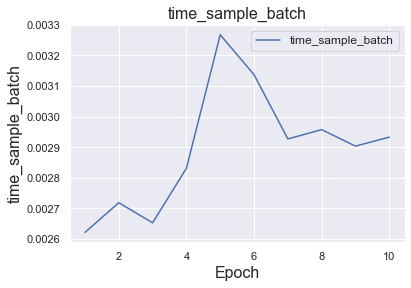

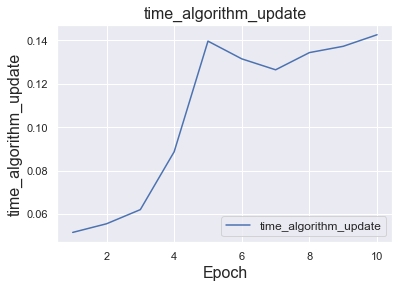

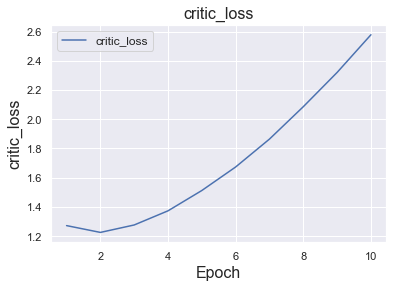

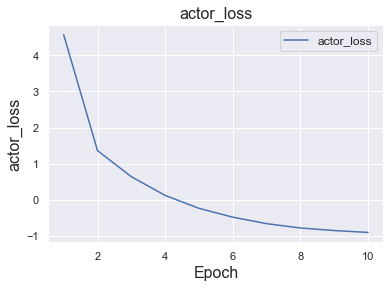

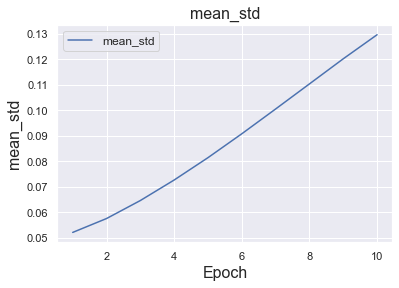

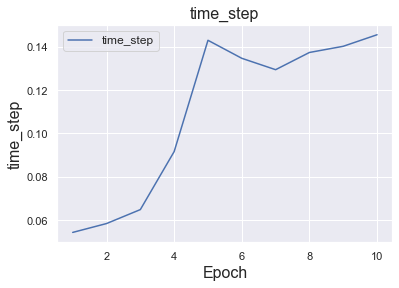

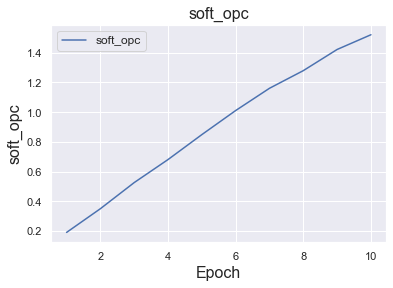

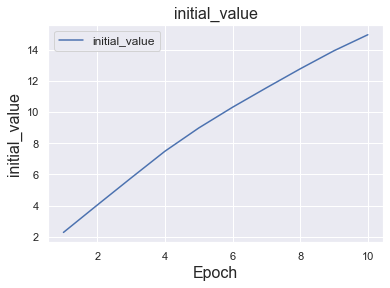

In [17]:
# Métricas que queremos graficar
metrics_to_plot = list(data_train[0][1].keys())

# Crear un gráfico de líneas para cada métr
for metric in metrics_to_plot:
    x = [entry[0] for entry in data_train]
    y = [entry[1][metric] for entry in data_train]
    plt.plot(x, y, label=metric)

    # Etiquetas y título del gráfico
    plt.title(f'{metric}', fontsize=16)

    # Agrandar el tamaño de fuente de la leyenda
    plt.legend(fontsize=12)

    # Etiquetas y título del gráfico
    plt.xlabel('Epoch', fontsize=16)
    plt.ylabel(metric, fontsize=16)

    # Mostrar el gráfico
    plt.show()

### Phase 3: Model evaluation

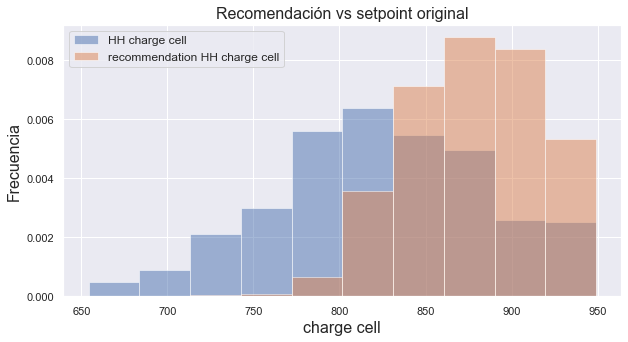

,HH charge cell,recommendation HH charge cell
count,815699.0,815699.0
mean,827.0,877.0
std,60.0,37.0
min,660.0,654.0
25%,790.0,850.0
50%,830.0,879.0
75%,875.0,909.0
max,949.0,943.0


In [18]:
#  rec HH charge cell data train
df_fin=df_mdp_train[states].copy()

original_hh_charge_cell=pd.DataFrame(scaler.inverse_transform(df_fin[states]),columns=states,index=df_fin.index)["HH charge cell"].values

df_fin["HH charge cell"]=awac.predict([observations_train]).squeeze()

df_fin=pd.DataFrame(scaler.inverse_transform(df_fin),columns=df_fin.columns,index=df_fin.index).rename(columns={"HH charge cell":
                                                                                                       "recommendation HH charge cell"})

df_fin["HH charge cell"]=original_hh_charge_cell
ax=df_fin[["HH charge cell","recommendation HH charge cell"]].plot(kind="hist",figsize=(10,5),density=True,alpha=0.5)
ax.set_title("Recomendación vs setpoint original",fontsize=16)
ax.set_xlabel('charge cell', fontsize=16)
ax.set_ylabel('Frecuencia', fontsize=16)
ax.legend(fontsize=12)
plt.show()
df_fin[["HH charge cell","recommendation HH charge cell"]].describe().round(0)

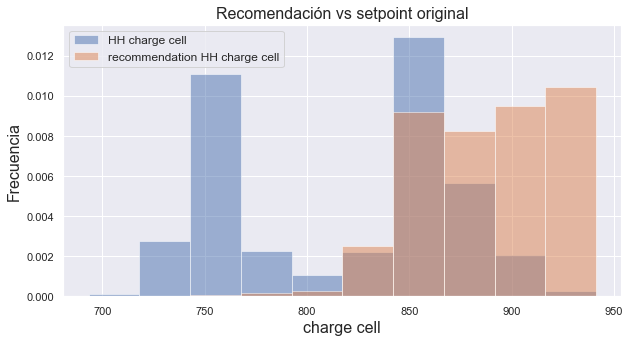

,HH charge cell,recommendation HH charge cell
count,81017.0,81017.0
mean,818.0,888.0
std,56.0,33.0
min,710.0,693.0
25%,760.0,861.0
50%,850.0,891.0
75%,860.0,917.0
max,930.0,941.0


In [19]:
#  rec HH charge cell data test
df_fin=df_mdp_test[states].copy()

original_hh_charge_cell=pd.DataFrame(scaler.inverse_transform(df_fin[states]),columns=states,index=df_fin.index)["HH charge cell"].values

observations_test=df_fin[states].to_numpy()

df_fin["HH charge cell"]=awac.predict([observations_test]).squeeze()

df_fin=pd.DataFrame(scaler.inverse_transform(df_fin),columns=df_fin.columns,index=df_fin.index).rename(columns={"HH charge cell":
                                                                                                       "recommendation HH charge cell"})

df_fin["HH charge cell"]=original_hh_charge_cell
ax=df_fin[["HH charge cell","recommendation HH charge cell"]].plot(kind="hist",figsize=(10,5),density=True,alpha=0.5)
ax.set_title("Recomendación vs setpoint original",fontsize=16)
ax.set_xlabel('charge cell', fontsize=16)
ax.set_ylabel('Frecuencia', fontsize=16)
ax.legend(fontsize=12)
plt.show()
df_fin[["HH charge cell","recommendation HH charge cell"]].describe().round(0)

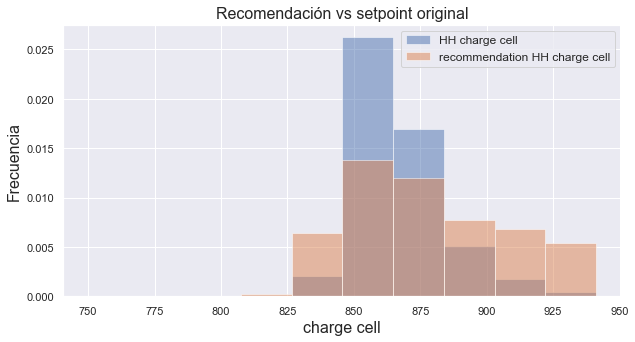

,HH charge cell,recommendation HH charge cell
count,41099.0,41099.0
mean,866.0,878.0
std,18.0,29.0
min,840.0,750.0
25%,850.0,855.0
50%,860.0,873.0
75%,875.0,900.0
max,930.0,941.0


In [32]:
# Test
test=df_mdp_test["2021-09"].copy()
original_hh_charge_cell=pd.DataFrame(scaler.inverse_transform(test[states]),columns=states,index=test.index)["HH charge cell"].values

observations_test=test[states].to_numpy()

test["HH charge cell"]=awac.predict([observations_test]).squeeze()

# Recomendación futura
test["HH charge cell"]=test["HH charge cell"].shift(-desfase)

df_fin=pd.DataFrame(scaler.inverse_transform(test[states]),columns=states,index=test.index).rename(columns={"HH charge cell":
                                                                                                       "recommendation HH charge cell"})
 
                                                                                                       
df_fin["HH charge cell"]=original_hh_charge_cell
df_fin=df_fin.join(df[["power","TPH"]])
df_fin["charge cell/power"]=df_fin["charge cell"]/df_fin["power"]
df_fin.dropna(inplace=True)

ax=df_fin[["HH charge cell","recommendation HH charge cell"]].plot(kind="hist",alpha=0.5,figsize=(10,5),density=True,)
ax.set_title("Recomendación vs setpoint original",fontsize=16)
ax.set_xlabel('charge cell', fontsize=16)
ax.set_ylabel('Frecuencia', fontsize=16)
ax.legend(fontsize=12)
plt.show()
df_fin[["HH charge cell","recommendation HH charge cell"]].describe().round(0)

In [33]:
titulos=tuple(["TPH & HH TPH", "Real charge cell setpoint & Recommendation charge cell setpoint",#"Real charge cell setpoint","Recommendation charge cell setpoint",
               ])
fig = make_subplots(
    rows=4, cols=1,
    subplot_titles=titulos,
     shared_xaxes=True, 
     vertical_spacing=0.05
    )

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['TPH'], ##FF6511
                    mode='lines',
                    name="TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)  

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH TPH'], ##FF6511
                    mode='lines',
                    name="HH TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)  






#############
fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['recommendation HH charge cell'], 
                    mode='lines',
                    name="recommendation HH charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH charge cell'], 
                    mode='lines',
                    name="HH charge cell",line=dict(width=3, ),legendgroup = '1',),row=2, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['charge cell'], 
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1) 



###############




#################
fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['charge cell'], 
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=3, col=1)  




fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH charge cell'], 
                    mode='lines',
                    name="HH charge cell",line=dict(width=1, ),legendgroup = '1',showlegend=False),row=3, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['HH charge cell']-80, 
                    mode='lines',
                    name="LL charge cell",line=dict(width=1, ),legendgroup = '1',fill='tonexty',showlegend=False),row=3, col=1)   

#################

######
fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['recommendation HH charge cell'], 
                    mode='lines',
                    name="recommendation HH charge cell",line=dict(width=1, ),legendgroup = '1',showlegend=False),row=4, col=1) 

fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['recommendation HH charge cell']-80, 
                    mode='lines',
                    name="recommendation LL charge cell",line=dict(width=1, ),legendgroup = '1',fill='tonexty',showlegend=False),row=4, col=1) 
##############
fig.add_trace(go.Scatter(x=df_fin.index, y=df_fin['charge cell'], 
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=4, col=1)  


fig.update_layout(height=700, width=1200, title_text="Temporal signal analysis")
fig.update_layout(hovermode="x unified")

fig.show()